<a href="https://colab.research.google.com/github/AmritaANair/Reward_Side_Channels_Physical_RL_Implementation/blob/main/Mountain_Car_Continuous_Final_Project_First_Evaluation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive
drive.mount('/content/drive')

KeyboardInterrupt: ignored

In [1]:
!pip install stable-baselines3[extra]

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 170 kB 8.3 MB/s 
     |████████████████████████████████| 1.5 MB 40.1 MB/s 
     |████████████████████████████████| 1.6 MB 41.2 MB/s 
     |████████████████████████████████| 237 kB 58.2 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 51 kB 5.6 MB/s 
  Created wheel for gym: filename=gym-0.21.0-py3-none-any.whl size=1616825 sha256=7745f068d4fb4cc240803986ec474c3698a03dacb8c0752714cd67de70b5e5d1
  Stored in directory: /root/.cache/pip/wheels/76/ee/9c/36bfe3e079df99acf5ae57f4e3464ff2771b34447d6d2f2148
  Created wheel for AutoROM.accept-rom-license: filename=AutoROM.accept_rom_license-0.4.2-py3-none-any.whl size=441028 sha256=93006ff9e01b9b18c09f221986c4c43926c772730fbf408148ef765726075d87
  Stored in directory: /root/.cache/pip/whe

In [3]:
import gym

from stable_baselines3 import PPO
from stable_baselines3.ppo import MlpPolicy
from stable_baselines3.common.env_util import make_vec_env
import os
import time

In [4]:
!pip install pyvirtualdisplay
!pip install piglet
!apt-get install python-opengl -y
!pip install gym
!pip install pyglet==1.5.24
!pip install kora
import kora.install.py38

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 67 kB 4.2 MB/s 
Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
The following additional packages will be installed:
  freeglut3
Suggested packages:
  libgle3
The following NEW packages will be installed:
  freeglut3 python-opengl
0 upgraded, 2 newly installed, 0 to remove and 5 not upgraded.
Need to get 570 kB of archives.
After this operation, 5,733 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 freeglut3 amd64 2.8.1-3 [73.6 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 python-opengl all 3.1.0+dfs

In [5]:
!pip install gym
!apt-get install python-opengl -y
!apt install xvfb -y
!apt-get update
!apt-get install xvfb

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Reading package lists... Done
Building dependency tree       
Reading state information... Done
python-opengl is already the newest version (3.1.0+dfsg-1).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 5 not upgraded.
Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
The following NEW packages will be installed:
  xvfb
0 upgraded, 1 newly installed, 0 to remove and 5 not upgraded.
Need to get 785 kB of archives.
After this operation, 2,271 kB of additional disk space will be used.
Ign:1 http://archive.ubuntu.com/ubuntu bionic-updates/universe amd64 xvfb amd64 2:1.19.6-1ubuntu4.

In [6]:

# To activate virtual display 
# need to run a script once for training an agent as follows
from pyvirtualdisplay import Display
display = Display(visible=0, size=(1400, 900))
display.start()
# This code creates a virtual display to draw game images on. 
# If you are running locally, just ignore it
import os
if type(os.environ.get("DISPLAY")) is not str or len(os.environ.get("DISPLAY"))==0:
    %%bash ../xvfb start
    %env DISPLAY=:1

#
# Import libraries
#
import gym
from gym import logger as gymlogger
from gym.wrappers.monitor import Monitor
gymlogger.set_level(40) # error only
import tensorflow as tf
import numpy as np
import random
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import math
import glob
import io
import base64
from IPython.display import HTML

from IPython import display as ipythondisplay

"""
Utility functions to enable video recording of gym environment and displaying it
To enable video, just do "env = wrap_env(env)""
"""

def show_video():
  mp4list = glob.glob('video/*.mp4')
  if len(mp4list) > 0:
    mp4 = mp4list[0]
    video = io.open(mp4, 'r+b').read()
    encoded = base64.b64encode(video)
    ipythondisplay.display(HTML(data='''<video alt="test" autoplay 
                loop controls style="height: 400px;">
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded.decode('ascii'))))
  else: 
    print("Could not find video")
    

def wrap_env(env):
  env = Monitor(env, './video', force=True)
  return env



In [7]:
# Saving logs to visulise in Tensorboard, saving models
models_dir = f"models/Mountain-Car"
logdir = f"logs/Mountain-Car"

if not os.path.exists(models_dir):
    os.makedirs(models_dir)

if not os.path.exists(logdir):
    os.makedirs(logdir)

In [8]:
# Parallel environments
env = make_vec_env("MountainCarContinuous-v0", n_envs=1)

# The learning agent and hyperparameters
model = PPO(
    policy=MlpPolicy,
    env=env,
    seed=0,
    batch_size=256,
    ent_coef=0.00429,
    learning_rate=7.77e-05,
    n_epochs=10,
    n_steps=8,
    gae_lambda=0.9,
    gamma=0.9999,
    clip_range=0.1,
    max_grad_norm =5,
    vf_coef=0.19,
    use_sde=True,
    policy_kwargs=dict(log_std_init=-3.29, ortho_init=False),
    verbose=1,
    tensorboard_log=logdir
    )


Using cpu device


/usr/local/lib/python3.7/dist-packages/stable_baselines3/ppo/ppo.py:152: UserWarning: You have specified a mini-batch size of 256, but because the `RolloutBuffer` is of size `n_steps * n_envs = 8`, after every 0 untruncated mini-batches, there will be a truncated mini-batch of size 8
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=8 and n_envs=1)
  f"You have specified a mini-batch size of {batch_size},"


In [ ]:
#Training and saving models along the way
TIMESTEPS = 200000
for i in range(10000): 
    model.learn(total_timesteps=TIMESTEPS, reset_num_timesteps=False, tb_log_name="PPO")
    model.save(f"{models_dir}/{TIMESTEPS*i}")

Streaming output truncated to the last 5000 lines.
|    loss                 | 0.00323       |
|    n_updates            | 250220        |
|    policy_gradient_loss | 0.000475      |
|    std                  | 0.0561        |
|    value_loss           | 8.01e-06      |
-------------------------------------------
------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 999          |
|    ep_rew_mean          | -2.48        |
| time/                   |              |
|    fps                  | 154          |
|    iterations           | 24774        |
|    time_elapsed         | 1281         |
|    total_timesteps      | 200192       |
| train/                  |              |
|    approx_kl            | 1.116097e-05 |
|    clip_fraction        | 0            |
|    clip_range           | 0.1          |
|    entropy_loss         | 0.995        |
|    explained_variance   | 4.17e-07     |
|    learning_rate        | 7.77e-05    

Streaming output truncated to the last 5000 lines.
|    loss                 | -0.000723     |
|    n_updates            | 500220        |
|    policy_gradient_loss | -0.000293     |
|    std                  | 0.109         |
|    value_loss           | 0.000148      |
-------------------------------------------
------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 981          |
|    ep_rew_mean          | -4.01        |
| time/                   |              |
|    fps                  | 152          |
|    iterations           | 24774        |
|    time_elapsed         | 1299         |
|    total_timesteps      | 400192       |
| train/                  |              |
|    approx_kl            | 8.940697e-07 |
|    clip_fraction        | 0            |
|    clip_range           | 0.1          |
|    entropy_loss         | -0.0616      |
|    explained_variance   | 3.58e-07     |
|    learning_rate        | 7.77e-05    

Streaming output truncated to the last 5000 lines.
|    loss                 | -0.00549     |
|    n_updates            | 750220       |
|    policy_gradient_loss | -0.00431     |
|    std                  | 0.134        |
|    value_loss           | 0.0533       |
------------------------------------------
------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 885          |
|    ep_rew_mean          | 1.97         |
| time/                   |              |
|    fps                  | 149          |
|    iterations           | 24774        |
|    time_elapsed         | 1328         |
|    total_timesteps      | 600192       |
| train/                  |              |
|    approx_kl            | 0.0007574484 |
|    clip_fraction        | 0            |
|    clip_range           | 0.1          |
|    entropy_loss         | -0.852       |
|    explained_variance   | -0.0027      |
|    learning_rate        | 7.77e-05     |
|  

Streaming output truncated to the last 5000 lines.
|    loss                 | -0.00628     |
|    n_updates            | 1000220      |
|    policy_gradient_loss | -0.000815    |
|    std                  | 0.186        |
|    value_loss           | 0.00569      |
------------------------------------------
-------------------------------------------
| rollout/                |               |
|    ep_len_mean          | 884           |
|    ep_rew_mean          | -67.9         |
| time/                   |               |
|    fps                  | 148           |
|    iterations           | 24774         |
|    time_elapsed         | 1331          |
|    total_timesteps      | 800192        |
| train/                  |               |
|    approx_kl            | 0.00054596364 |
|    clip_fraction        | 0             |
|    clip_range           | 0.1           |
|    entropy_loss         | -1.15         |
|    explained_variance   | 5.96e-08      |
|    learning_rate        | 7.7

Streaming output truncated to the last 5000 lines.
|    loss                 | -0.00889      |
|    n_updates            | 1084120       |
|    policy_gradient_loss | -2.45e-06     |
|    std                  | 0.248         |
|    value_loss           | 1.38e-05      |
-------------------------------------------
---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 945       |
|    ep_rew_mean          | -82.1     |
| time/                   |           |
|    fps                  | 146       |
|    iterations           | 8164      |
|    time_elapsed         | 444       |
|    total_timesteps      | 867312    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.1       |
|    entropy_loss         | -2.05     |
|    explained_variance   | -0.131    |
|    learning_rate        | 7.77e-05  |
|    loss                 | -0.00885  |
|    

In [ ]:
'''import imageio
import numpy as np

from stable_baselines3 import A2C

model = A2C("MlpPolicy", "MountainCarContinuous-v0").learn(100_000)

images = []
obs = model.env.reset()
img = model.env.render(mode="rgb_array")
for i in range(350):
    images.append(img)
    action, _ = model.predict(obs)
    obs, _, _ ,_ = model.env.step(action)
    img = model.env.render(mode="rgb_array")

imageio.mimsave("MountainCarContinuous.gif", [np.array(img) for i, img in enumerate(images) if i%2 == 0], fps=29)'''

In [ ]:
import shutil

original = r"/content/models/Mountain-Car"
target = r'gdrive/MyDrive/Mountain-Car - Model Data/path/to/output_dir/ppo-agent-results-ep-20-'+ datetime.datetime.now().strftime('%Y-%m-%d_%H-%M-%S')

shutil.copytree(original, target)

In [15]:
import imageio
import numpy as np

#from stable_baselines3 import A2C

models_dir = "/content/models/Mountain-Car"
model_path = f"{models_dir}/80000"
best_model = PPO.load(model_path, env=env)

obs = env.reset()
images = []

img = model.env.render(mode="rgb_array")
for i in range(1000):
    images.append(img)
    action, _ = model.predict(obs)
    obs, _, _ ,_ = model.env.step(action)
    img = model.env.render(mode="rgb_array")

imageio.mimsave("MountainCarContinuous.gif", [np.array(img) for i, img in enumerate(images) if i%2 == 0], fps=29)


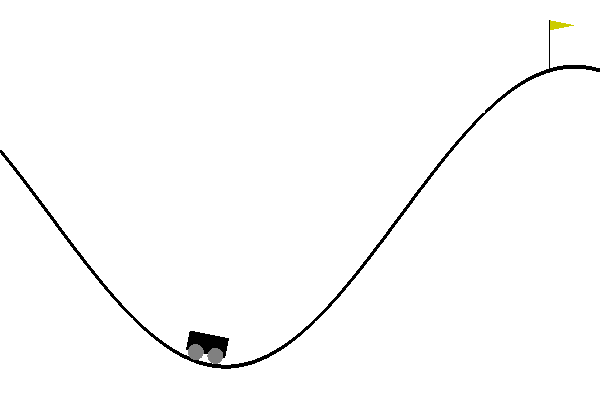

In [16]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
from IPython import display
ifPath = "/content/MountainCarContinuous.gif"

with open(ifPath,'rb') as f:
    display.Image(data=f.read(), format='png')

Environment Code:

In [ ]:
# -*- coding: utf-8 -*-
"""
@author: Olivier Sigaud

A merge between two sources:

* Adaptation of the MountainCar Environment from the "FAReinforcement" library
of Jose Antonio Martin H. (version 1.0), adapted by  'Tom Schaul, tom@idsia.ch'
and then modified by Arnaud de Broissia

* the OpenAI/gym MountainCar environment
itself from
http://incompleteideas.net/sutton/MountainCar/MountainCar1.cp
permalink: https://perma.cc/6Z2N-PFWC
"""

import math

import numpy as np

import gym
from gym import spaces
from gym.utils import seeding


class Continuous_MountainCarEnv(gym.Env):
    """
    Description:
        The agent (a car) is started at the bottom of a valley. For any given
        state the agent may choose to accelerate to the left, right or cease
        any acceleration.
    Observation:
        Type: Box(2)
        Num    Observation               Min            Max
        0      Car Position              -1.2           0.6
        1      Car Velocity              -0.07          0.07
    Actions:
        Type: Box(1)
        Num    Action                    Min            Max
        0      the power coef            -1.0           1.0
        Note: actual driving force is calculated by multipling the power coef by power (0.0015)

    Reward:
         Reward of 100 is awarded if the agent reached the flag (position = 0.45) on top of the mountain.
         Reward is decrease based on amount of energy consumed each step.

    Starting State:
         The position of the car is assigned a uniform random value in
         [-0.6 , -0.4].
         The starting velocity of the car is always assigned to 0.

    Episode Termination:
         The car position is more than 0.45
         Episode length is greater than 200
    """

    metadata = {"render.modes": ["human", "rgb_array"], "video.frames_per_second": 30}

    def __init__(self, goal_velocity=0):
        self.min_action = -1.0
        self.max_action = 1.0
        self.min_position = -1.2
        self.max_position = 0.6
        self.max_speed = 0.07
        self.goal_position = (
            0.45  # was 0.5 in gym, 0.45 in Arnaud de Broissia's version
        )
        self.goal_velocity = goal_velocity
        self.power = 0.0015

        self.low_state = np.array(
            [self.min_position, -self.max_speed], dtype=np.float32
        )
        self.high_state = np.array(
            [self.max_position, self.max_speed], dtype=np.float32
        )

        self.viewer = None

        self.action_space = spaces.Box(
            low=self.min_action, high=self.max_action, shape=(1,), dtype=np.float32
        )
        self.observation_space = spaces.Box(
            low=self.low_state, high=self.high_state, dtype=np.float32
        )

        self.seed()

    def seed(self, seed=None):
        self.np_random, seed = seeding.np_random(seed)
        return [seed]

    def step(self, action):

        position = self.state[0]
        velocity = self.state[1]
        force = min(max(action[0], self.min_action), self.max_action)

        velocity += force * self.power - 0.0025 * math.cos(3 * position)
        if velocity > self.max_speed:
            velocity = self.max_speed
        if velocity < -self.max_speed:
            velocity = -self.max_speed
        position += velocity
        if position > self.max_position:
            position = self.max_position
        if position < self.min_position:
            position = self.min_position
        if position == self.min_position and velocity < 0:
            velocity = 0

        # Convert a possible numpy bool to a Python bool.
        done = bool(position >= self.goal_position and velocity >= self.goal_velocity)

        reward = 0
        if done:
            reward = 100.0
        reward -= math.pow(action[0], 2) * 0.1

        self.state = np.array([position, velocity], dtype=np.float32)
        return self.state, reward, done, {}

    def reset(self):
        self.state = np.array([self.np_random.uniform(low=-0.6, high=-0.4), 0])
        return np.array(self.state, dtype=np.float32)

    def _height(self, xs):
        return np.sin(3 * xs) * 0.45 + 0.55

    def render(self, mode="human"):
        screen_width = 600
        screen_height = 400

        world_width = self.max_position - self.min_position
        scale = screen_width / world_width
        carwidth = 40
        carheight = 20

        if self.viewer is None:
            from gym.envs.classic_control import rendering

            self.viewer = rendering.Viewer(screen_width, screen_height)
            xs = np.linspace(self.min_position, self.max_position, 100)
            ys = self._height(xs)
            xys = list(zip((xs - self.min_position) * scale, ys * scale))

            self.track = rendering.make_polyline(xys)
            self.track.set_linewidth(4)
            self.viewer.add_geom(self.track)

            clearance = 10

            l, r, t, b = -carwidth / 2, carwidth / 2, carheight, 0
            car = rendering.FilledPolygon([(l, b), (l, t), (r, t), (r, b)])
            car.add_attr(rendering.Transform(translation=(0, clearance)))
            self.cartrans = rendering.Transform()
            car.add_attr(self.cartrans)
            self.viewer.add_geom(car)
            frontwheel = rendering.make_circle(carheight / 2.5)
            frontwheel.set_color(0.5, 0.5, 0.5)
            frontwheel.add_attr(
                rendering.Transform(translation=(carwidth / 4, clearance))
            )
            frontwheel.add_attr(self.cartrans)
            self.viewer.add_geom(frontwheel)
            backwheel = rendering.make_circle(carheight / 2.5)
            backwheel.add_attr(
                rendering.Transform(translation=(-carwidth / 4, clearance))
            )
            backwheel.add_attr(self.cartrans)
            backwheel.set_color(0.5, 0.5, 0.5)
            self.viewer.add_geom(backwheel)
            flagx = (self.goal_position - self.min_position) * scale
            flagy1 = self._height(self.goal_position) * scale
            flagy2 = flagy1 + 50
            flagpole = rendering.Line((flagx, flagy1), (flagx, flagy2))
            self.viewer.add_geom(flagpole)
            flag = rendering.FilledPolygon(
                [(flagx, flagy2), (flagx, flagy2 - 10), (flagx + 25, flagy2 - 5)]
            )
            flag.set_color(0.8, 0.8, 0)
            self.viewer.add_geom(flag)

        pos = self.state[0]
        self.cartrans.set_translation(
            (pos - self.min_position) * scale, self._height(pos) * scale
        )
        self.cartrans.set_rotation(math.cos(3 * pos))

        return self.viewer.render(return_rgb_array=mode == "rgb_array")

    def close(self):
        if self.viewer:
            self.viewer.close()
            self.viewer = None


In [ ]:



'''


"""
http://incompleteideas.net/MountainCar/MountainCar1.cp
permalink: https://perma.cc/6Z2N-PFWC
"""
import math

import numpy as np

import gym
from gym import spaces
from gym.utils import seeding


class MountainCarEnv(gym.Env):
    """
    Description:
        The agent (a car) is started at the bottom of a valley. For any given
        state the agent may choose to accelerate to the left, right or cease
        any acceleration.

    Source:
        The environment appeared first in Andrew Moore's PhD Thesis (1990).

    Observation:
        Type: Box(2)
        Num    Observation               Min            Max
        0      Car Position              -1.2           0.6
        1      Car Velocity              -0.07          0.07

    Actions:
        Type: Discrete(3)
        Num    Action
        0      Accelerate to the Left
        1      Don't accelerate
        2      Accelerate to the Right

        Note: This does not affect the amount of velocity affected by the
        gravitational pull acting on the car.

    Reward:
         Reward of 0 is awarded if the agent reached the flag (position = 0.5)
         on top of the mountain.
         Reward of -1 is awarded if the position of the agent is less than 0.5.

    Starting State:
         The position of the car is assigned a uniform random value in
         [-0.6 , -0.4].
         The starting velocity of the car is always assigned to 0.

    Episode Termination:
         The car position is more than 0.5
         Episode length is greater than 200
    """

    metadata = {"render.modes": ["human", "rgb_array"], "video.frames_per_second": 30}

    def __init__(self, goal_velocity=0):
        self.min_position = -1.2
        self.max_position = 0.6
        self.max_speed = 0.07
        self.goal_position = 0.5
        self.goal_velocity = goal_velocity

        self.force = 0.001
        self.gravity = 0.0025

        self.low = np.array([self.min_position, -self.max_speed], dtype=np.float32)
        self.high = np.array([self.max_position, self.max_speed], dtype=np.float32)

        self.viewer = None

        self.action_space = spaces.Discrete(3)
        self.observation_space = spaces.Box(self.low, self.high, dtype=np.float32)

        self.seed()

    def seed(self, seed=None):
        self.np_random, seed = seeding.np_random(seed)
        return [seed]

    def step(self, action):
        assert self.action_space.contains(action), "%r (%s) invalid" % (
            action,
            type(action),
        )

        position, velocity = self.state
        velocity += (action - 1) * self.force + math.cos(3 * position) * (-self.gravity)
        velocity = np.clip(velocity, -self.max_speed, self.max_speed)
        position += velocity
        position = np.clip(position, self.min_position, self.max_position)
        if position == self.min_position and velocity < 0:
            velocity = 0

        done = bool(position >= self.goal_position and velocity >= self.goal_velocity)
        reward = -1.0

        self.state = (position, velocity)
        return np.array(self.state, dtype=np.float32), reward, done, {}

    def reset(self):
        self.state = np.array([self.np_random.uniform(low=-0.6, high=-0.4), 0])
        return np.array(self.state, dtype=np.float32)

    def _height(self, xs):
        return np.sin(3 * xs) * 0.45 + 0.55

    def render(self, mode="human"):
        screen_width = 600
        screen_height = 400

        world_width = self.max_position - self.min_position
        scale = screen_width / world_width
        carwidth = 40
        carheight = 20

        if self.viewer is None:
            from gym.envs.classic_control import rendering

            self.viewer = rendering.Viewer(screen_width, screen_height)
            xs = np.linspace(self.min_position, self.max_position, 100)
            ys = self._height(xs)
            xys = list(zip((xs - self.min_position) * scale, ys * scale))

            self.track = rendering.make_polyline(xys)
            self.track.set_linewidth(4)
            self.viewer.add_geom(self.track)

            clearance = 10

            l, r, t, b = -carwidth / 2, carwidth / 2, carheight, 0
            car = rendering.FilledPolygon([(l, b), (l, t), (r, t), (r, b)])
            car.add_attr(rendering.Transform(translation=(0, clearance)))
            self.cartrans = rendering.Transform()
            car.add_attr(self.cartrans)
            self.viewer.add_geom(car)
            frontwheel = rendering.make_circle(carheight / 2.5)
            frontwheel.set_color(0.5, 0.5, 0.5)
            frontwheel.add_attr(
                rendering.Transform(translation=(carwidth / 4, clearance))
            )
            frontwheel.add_attr(self.cartrans)
            self.viewer.add_geom(frontwheel)
            backwheel = rendering.make_circle(carheight / 2.5)
            backwheel.add_attr(
                rendering.Transform(translation=(-carwidth / 4, clearance))
            )
            backwheel.add_attr(self.cartrans)
            backwheel.set_color(0.5, 0.5, 0.5)
            self.viewer.add_geom(backwheel)
            flagx = (self.goal_position - self.min_position) * scale
            flagy1 = self._height(self.goal_position) * scale
            flagy2 = flagy1 + 50
            flagpole = rendering.Line((flagx, flagy1), (flagx, flagy2))
            self.viewer.add_geom(flagpole)
            flag = rendering.FilledPolygon(
                [(flagx, flagy2), (flagx, flagy2 - 10), (flagx + 25, flagy2 - 5)]
            )
            flag.set_color(0.8, 0.8, 0)
            self.viewer.add_geom(flag)

        pos = self.state[0]
        self.cartrans.set_translation(
            (pos - self.min_position) * scale, self._height(pos) * scale
        )
        self.cartrans.set_rotation(math.cos(3 * pos))

        return self.viewer.render(return_rgb_array=mode == "rgb_array")

    def get_keys_to_action(self):
        # Control with left and right arrow keys.
        return {(): 1, (276,): 0, (275,): 2, (275, 276): 1}

    def close(self):
        if self.viewer:
            self.viewer.close()
            self.viewer = None
'''

In [10]:
# Check model performance
# load the best model you observed from tensorboard - the one reach the goal/ obtaining highest return
'''
models_dir = "/content/models/Mountain-1668885132.9814198"
model_path = f"{models_dir}/80000"
best_model = PPO.load(model_path, env=env)

#obs = env.reset()
#while True:
 #   action, _states = best_model.predict(obs)
  #  obs, rewards, dones, info = env.step(action)
#env.play()  #use Python IDE to check, I havn't figure out how to render in Notebook'''

'\nmodels_dir = "/content/models/Mountain-1668885132.9814198"\nmodel_path = f"{models_dir}/80000"\nbest_model = PPO.load(model_path, env=env)\n\n#obs = env.reset()\n#while True:\n #   action, _states = best_model.predict(obs)\n  #  obs, rewards, dones, info = env.step(action)\n#env.play()  #use Python IDE to check, I havn\'t figure out how to render in Notebook'